In [33]:
using Distributions, Plots, Statistics, Images, CSV, DataFrames

In [2]:
function trial(s, T, f, p)
    N = rand(Binomial(T - s, p))
    if N < 1
        return NaN, NaN
    end
    inds = sample(s:T, N, replace = false)
    sinds = sort!(inds)
    D = sum(f.(sinds) .* ((-1) .^ ((1:N) .+ 1)))
    D += N % 2 == 0 ? f(T) : 0
    D, sinds
end

trial (generic function with 1 method)

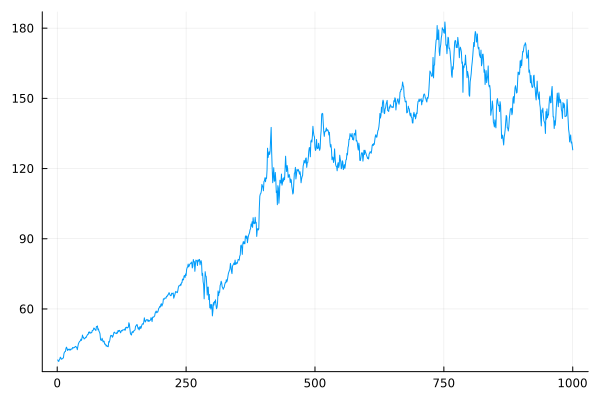

In [228]:
s = 1
T = 1000
p = .02
burnin = 20
# f(x) = sin(x^2/600 + x/10) + cos(x/10)
df = DataFrame(CSV.File(open("./AAPL.csv"); buffer_in_memory=true))
v = df[(end - 1000):end,:].Open
f(x) = v[x]
plot(s:T, x -> f(x), label = false)

In [4]:
unzip(a) = map(x->getfield.(a, x), fieldnames(eltype(a)))

unzip (generic function with 1 method)

In [248]:
profit, trials = unzip(filter(x -> !isnan(x[1]), [trial(s, T, f, p) for _ in 1:1_000_000]))
z_score = (profit .- mean(profit)) ./ std(profit);

In [249]:
holding_zscore = (f(T) - mean(profit)) / std(profit)

1.2072995586176687

In [250]:
1 - cdf(Normal(0, 1),holding_zscore)

0.11365840030314556

In [251]:
function ohe(s, T)
    function ohe_h(trial)
        N = length(trial)
        arr = zeros(T - s + 1)
        for (i, v) in enumerate(trial)
            arr[v - s + 1] = (-1) ^ (i + 1)
        end
        arr
    end
end

ohe (generic function with 1 method)

In [252]:
perm = sortperm(z_score)
M = reduce(hcat, ohe(s, T).(trials))'

1000000×1000 adjoint(::Matrix{Float64}) with eltype Float64:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0   0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0   0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0   0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  -1.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0   0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  1.0  0.0   0.0
 0.0  1.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0   0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0   0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0   0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0   0.0
 ⋮                        ⋮         ⋱            ⋮                   
 0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0   0.0
 0.0  0.0  0.0  0.0  0.0  0.0  1.0     0.0  0.0  0.0  0

In [253]:
M = M[:, burnin:end]
F = M[perm,:]
z = z_score[perm]

1000000-element Vector{Float64}:
 -4.616300211769738
 -4.248046968300167
 -4.216673439879879
 -4.101871700325749
 -4.094555181829596
 -4.074718876974203
 -4.050871710862931
 -4.030683555358657
 -4.01401154492945
 -4.006062382222037
  ⋮
  4.141715078983062
  4.14516156235248
  4.241392929495669
  4.300622875228277
  4.344940171113078
  4.395376426711366
  4.458475226863835
  4.459390060018326
  4.468675675571752

In [9]:
to_prob(x) = x ./ sum(x)
softmax(x) = exp.(x) ./ sum(exp.(x))

softmax (generic function with 1 method)

In [10]:
min_z, max_z = minimum(z), maximum(z)

(-4.376276742283304, 4.66549931736104)

In [122]:
function symd(m, s, A, B) 
    function la(x)
        uf(x) = exp(-((x - m)/s)^2)
        nor = uf.(A:B)
        uf(x) / sum(nor)
    end
    la
end

symd (generic function with 2 methods)

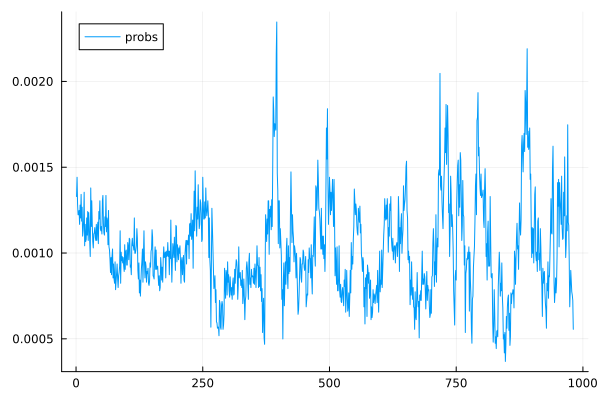

In [25]:
plot(to_prob(sum(F[z .>= 1, :] .> 0, dims = 1))[1,:], label = "probs")
# plot!(s:T, x -> f(x) * 0.01, label = "f(x) * 0.01")

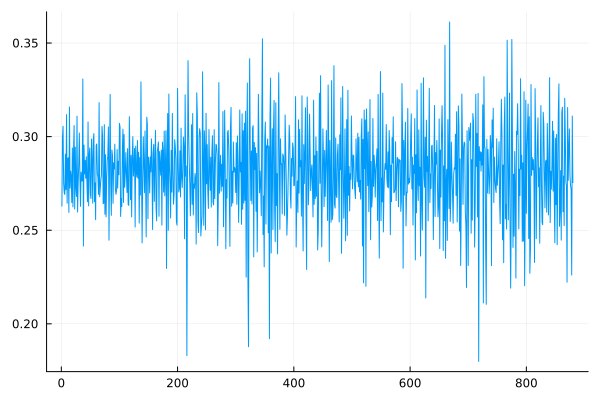

In [212]:
msig = to_prob(sum(F[z .>= 1, :] .> 0, dims = 1))[1,:]
sig2 = []
win = 50
s = 2
for i in (win + 1):1:(length(msig)-(win + 1))
    A = i - win
    B = i + win
    SD = symd(i, s, A, B)
    draw = msig[A:B] .* SD.(A:B)
    push!(sig2, (SD(i) * msig[i]) / sum(draw))
    # push!(sig2, msig[i]/sum(msig[i:(i+14)]))
end
plot(sig2, label = false)

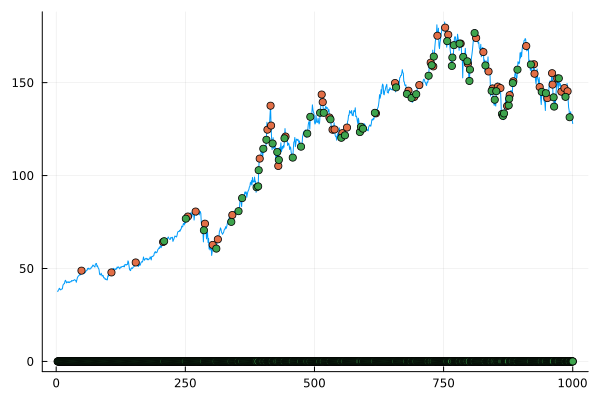

In [192]:
long_signals = [zeros(win + burnin); sig2 .> .22; zeros(win)]
short_signals = [zeros(win + burnin); sig2 .< .16; zeros(win)]
plot(s:T, x -> f(x), label = false)
scatter!(s:T, x -> f(x) * long_signals[x], label = false)
scatter!(s:T, x -> f(x) * short_signals[x], label = false)

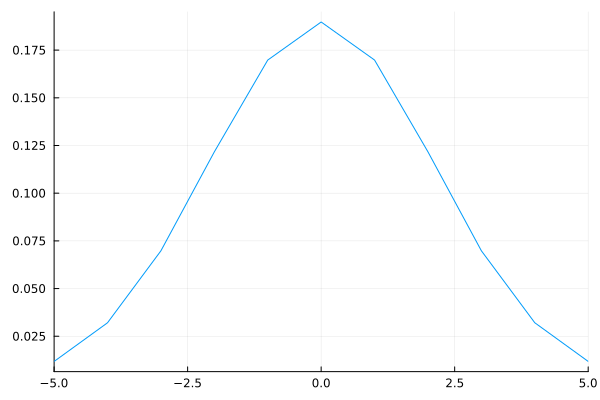

In [160]:
A, B = -5, 5
da = symd(0, 3, A, B).(A:B)
plot(A:B, da, xlims = (A, B), label = false)

In [14]:
density = [to_prob(sum(F[z .>= k, :] .> 0, dims = 1)) for k in -3:.01:3]

601-element Vector{Matrix{Float64}}:
 [0.0014907359246148174 0.0014866959898597637 … 0.0010069537376971361 0.0009776642107229968]
 [0.0014907524866074676 0.001486712506968965 … 0.0010069649248967785 0.0009776750725176346]
 [0.001490776577435541 0.0014867365325102414 … 0.0010069811976309176 0.0009766808606911708]
 [0.0014907901288685045 0.0014867500472184542 … 0.0010069903512749992 0.0009766897388996231]
 [0.0014908593955959043 0.0014868191262311459 … 0.0010070371391660681 0.000976735118930379]
 [0.0014909196327650802 0.0014868792001559608 … 0.001007077827823025 0.0009757644751023492]
 [0.0014910250595248317 0.0014869843412063362 … 0.0010071490408849982 0.0009748232943370343]
 [0.0014910777784961531 0.0014870369173078167 … 0.0010071846511928622 0.0009748577616861706]
 [0.0014910943480856713 0.0014870534419932982 … 0.0010071958435239933 0.0009748685947850086]
 [0.0014911832276236641 0.0014871420806653343 … 0.001007255879363681 0.0009749267036970433]
 ⋮
 [0.0012254901960784314 0.000612745

In [15]:
D = reduce(vcat, density)

601×981 Matrix{Float64}:
 0.00149074   0.0014867    0.00140994  …  0.00100695   0.000977664
 0.00149075   0.00148671   0.00140995     0.00100696   0.000977675
 0.00149078   0.00148674   0.00140998     0.00100698   0.000976681
 0.00149079   0.00148675   0.00140999     0.00100699   0.00097669
 0.00149086   0.00148682   0.00141005     0.00100704   0.000976735
 0.00149092   0.00148688   0.00141011  …  0.00100708   0.000975764
 0.00149103   0.00148698   0.00141021     0.00100715   0.000974823
 0.00149108   0.00148704   0.00141026     0.00100718   0.000974858
 0.00149109   0.00148705   0.00141028     0.0010072    0.000974869
 0.00149118   0.00148714   0.00141036     0.00100726   0.000974927
 ⋮                                     ⋱               ⋮
 0.00122549   0.000612745  0.00122549     0.000612745  0.000612745
 0.00127632   0.000638162  0.00127632     0.000638162  0.000638162
 0.00129786   0.000648929  0.00129786     0.000648929  0.000648929
 0.000669792  0.000669792  0.00133958  …  0.0006

In [16]:
D

601×981 Matrix{Float64}:
 0.00149074   0.0014867    0.00140994  …  0.00100695   0.000977664
 0.00149075   0.00148671   0.00140995     0.00100696   0.000977675
 0.00149078   0.00148674   0.00140998     0.00100698   0.000976681
 0.00149079   0.00148675   0.00140999     0.00100699   0.00097669
 0.00149086   0.00148682   0.00141005     0.00100704   0.000976735
 0.00149092   0.00148688   0.00141011  …  0.00100708   0.000975764
 0.00149103   0.00148698   0.00141021     0.00100715   0.000974823
 0.00149108   0.00148704   0.00141026     0.00100718   0.000974858
 0.00149109   0.00148705   0.00141028     0.0010072    0.000974869
 0.00149118   0.00148714   0.00141036     0.00100726   0.000974927
 ⋮                                     ⋱               ⋮
 0.00122549   0.000612745  0.00122549     0.000612745  0.000612745
 0.00127632   0.000638162  0.00127632     0.000638162  0.000638162
 0.00129786   0.000648929  0.00129786     0.000648929  0.000648929
 0.000669792  0.000669792  0.00133958  …  0.0006

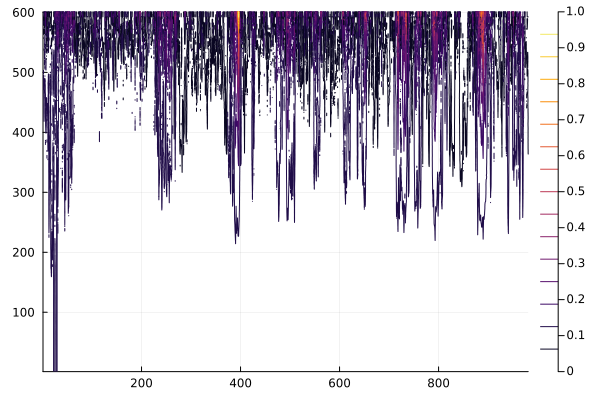

In [17]:
mi, ma = minimum(D), maximum(D)
(D .- mi) ./ (ma - mi) |> contour

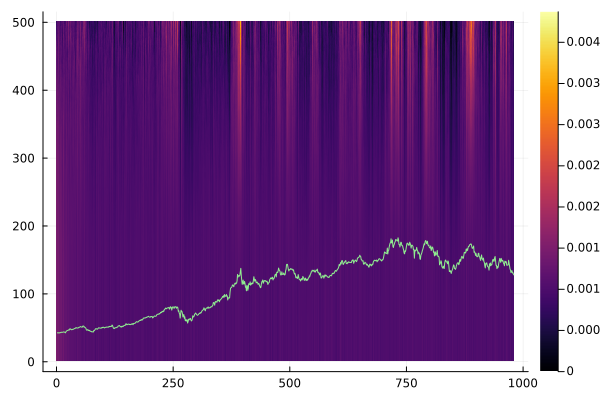

In [223]:
heatmap(D[1:500,:])
plot!(s:(T - burnin), x -> f(x + burnin), label = false, color = :lightgreen)

In [19]:
longs = []
shorts = []
period = 30
for i in s:period:(T - period)
    npmm_max = argmax(f.(i:(i + period))) + i - 1
    npmm_min = argmin(f.(i:(i + period))) + i - 1
    push!(shorts, npmm_max)
    push!(longs, npmm_min)
end

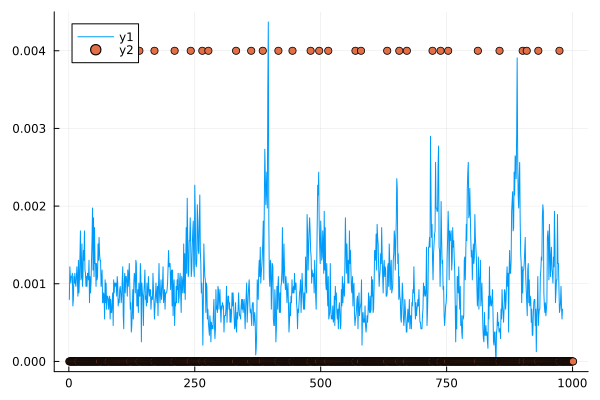

In [247]:
plot([D[500,1:(end-1)]])
scatter!(abs.(ohe(0, 1000)(shorts)) .* 0.004)

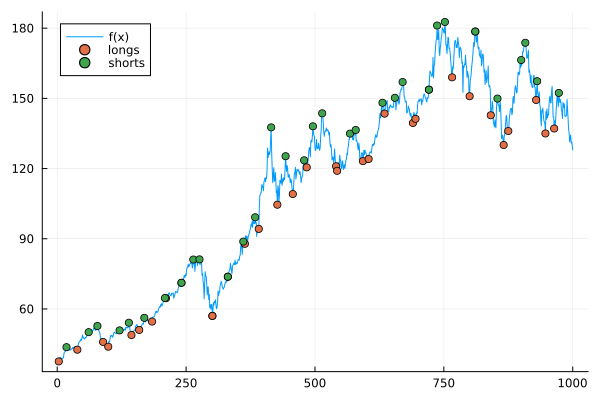

In [20]:
plot(s:T, x -> f(x), label = "f(x)")
scatter!(longs .|> Int64, x -> f(x |> Int64), label = "longs")
scatter!(shorts .|> Int64, x -> f(x |> Int64), label = "shorts")

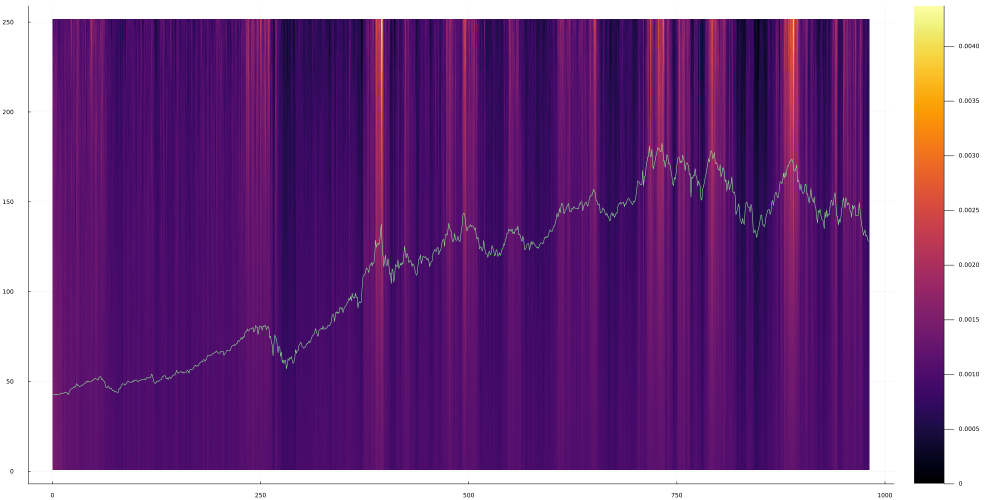

In [21]:
heatmap(D[250:500,:], size = (2000, 1000))
fig = plot!(s:(T - burnin), x -> f(x + burnin), label = false, color = :lightgreen)

In [22]:
savefig(fig, "npmm_vs_joint_profit.png")

"e:\\github\\miniprojects\\algotrading\\npmm_vs_joint_profit.png"